<a href="https://colab.research.google.com/github/hantswilliams/voiceCloneTts/blob/main/Part2_Configuration_TTS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Setup**

#### Install Repo to Google Drive

Colab is a little funky. I’ve found the best way to do this is to install the repo directly into your Google Drive folder. This will save the training if it crashes. 

First, mount your Drive to the Colab notebook: 

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### Installing Libraries
Next, run the cell below. If you’re already installed the repo, it will skip the installation process and change into the repo’s directory. If you haven’t installed it, it will install all the libraries necessary.

In [9]:
## make sure you have your voices in there 
%%bash
git clone https://github.com/hantswilliams/voiceCloneTts.git;

Cloning into 'voiceCloneTts'...


In [11]:
## rename the folder to make the following instructions 
%%bash 
mv voiceCloneTts TTS

In [1]:
import os
if os.path.isdir("/content/drive/MyDrive/VoiceCloning"):
    %cd "/content/drive/My Drive/VoiceCloning/TTS"
    !pip install -r requirements.txt
    %cd ..
    
else:
    #installs all needed files and libraries
    %cd "/content/drive/My Drive/"
    !mkdir VoiceCloning
    %cd VoiceCloning
    !git clone https://github.com/coqui-ai/TTS
    !mkdir datasets
    !mkdir log 
    !mkdir configs
    !mkdir models
    !mkdir output
    !mkdir WadaSNR

    !gdown https://drive.google.com/uc?id=1BksOJ-I10F0Itt2WM6kKrNmKYgOVSNSl -O /content/drive/MyDrive/VoiceCloning/models/vits_model.tar #change this link to change model to train off of (for instance training off of a different language)
    !gdown https://drive.google.com/uc?id=1gqogUxwBeuzL0qxJJBNArYzga79P-GDP -O /content/drive/MyDrive/VoiceCloning/TTS/TTS/tts/datasets/formatters.py
    !gdown https://drive.google.com/uc?id=180cb7NPgbcqwqCTdZv_2nc4JsQaC0Wcl -O /content/drive/MyDrive/VoiceCloning/configs/generic_config.json
    !gdown https://drive.google.com/uc?id=1BFY3Q8HInytSfOG3i3lsIAR3XdVcgBc1 -O /content/drive/MyDrive/VoiceCloning/configs/train_vits.py #
    %cd TTS 
    !pip install -e .[notebooks]

/content/drive/My Drive/VoiceCloning/TTS
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
/content/drive/My Drive/VoiceCloning


In [3]:
import os
if os.path.isdir("/content/drive/MyDrive/VoiceCloning"):
    #installs all needed files and libraries
    %cd "/content/drive/My Drive/VoiceCloning/"
    !git clone https://github.com/coqui-ai/TTS
    !mkdir datasets
    !mkdir log 
    !mkdir configs
    !mkdir models
    !mkdir output
    !mkdir WadaSNR

    !gdown https://drive.google.com/uc?id=1BksOJ-I10F0Itt2WM6kKrNmKYgOVSNSl -O /content/drive/MyDrive/VoiceCloning/models/vits_model.tar #change this link to change model to train off of (for instance training off of a different language)
    !gdown https://drive.google.com/uc?id=1gqogUxwBeuzL0qxJJBNArYzga79P-GDP -O /content/drive/MyDrive/VoiceCloning/TTS/TTS/tts/datasets/formatters.py
    !gdown https://drive.google.com/uc?id=180cb7NPgbcqwqCTdZv_2nc4JsQaC0Wcl -O /content/drive/MyDrive/VoiceCloning/configs/generic_config.json
    !gdown https://drive.google.com/uc?id=1BFY3Q8HInytSfOG3i3lsIAR3XdVcgBc1 -O /content/drive/MyDrive/VoiceCloning/configs/train_vits.py #

/content/drive/My Drive/VoiceCloning
fatal: destination path 'TTS' already exists and is not an empty directory.
Downloading...
From: https://drive.google.com/uc?id=1BksOJ-I10F0Itt2WM6kKrNmKYgOVSNSl
To: /content/drive/MyDrive/VoiceCloning/models/vits_model.tar
100% 146M/146M [00:02<00:00, 60.7MB/s]
Traceback (most recent call last):
  File "/usr/local/bin/gdown", line 8, in <module>
    sys.exit(main())
  File "/usr/local/lib/python3.7/dist-packages/gdown/cli.py", line 166, in main
    resume=args.continue_,
  File "/usr/local/lib/python3.7/dist-packages/gdown/download.py", line 202, in download
    for file in os.listdir(osp.dirname(output) or "."):
FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/VoiceCloning/TTS/TTS/tts/datasets'
Downloading...
From: https://drive.google.com/uc?id=180cb7NPgbcqwqCTdZv_2nc4JsQaC0Wcl
To: /content/drive/MyDrive/VoiceCloning/configs/generic_config.json
100% 5.68k/5.68k [00:00<00:00, 10.3MB/s]
Downloading...
From: https://dr

In [4]:
!gdown https://drive.google.com/uc?id=1gqogUxwBeuzL0qxJJBNArYzga79P-GDP -O /content/drive/MyDrive/VoiceCloning/TTS/TTS/tts/datasets/formatters.py


Downloading...
From: https://drive.google.com/uc?id=1gqogUxwBeuzL0qxJJBNArYzga79P-GDP
To: /content/drive/MyDrive/VoiceCloning/TTS/TTS/tts/datasets/formatters.py
100% 16.9k/16.9k [00:00<00:00, 28.3MB/s]


Upload your dataset zip to the dataset folder

In [5]:
!unzip /content/drive/MyDrive/VoiceCloning/datasets/fetusboy.zip -d "/content/drive/MyDrive/VoiceCloning/datasets"

Archive:  /content/drive/MyDrive/VoiceCloning/datasets/fetusboy.zip
   creating: /content/drive/MyDrive/VoiceCloning/datasets/wavs/
  inflating: /content/drive/MyDrive/VoiceCloning/datasets/wavs/CloneVoice1.wav  
  inflating: /content/drive/MyDrive/VoiceCloning/datasets/wavs/CloneVoice2.wav  
  inflating: /content/drive/MyDrive/VoiceCloning/datasets/wavs/CloneVoice3.wav  
  inflating: /content/drive/MyDrive/VoiceCloning/datasets/wavs/CloneVoice7.wav  
  inflating: /content/drive/MyDrive/VoiceCloning/datasets/wavs/CloneVoice6.wav  
  inflating: /content/drive/MyDrive/VoiceCloning/datasets/wavs/CloneVoice4.wav  
  inflating: /content/drive/MyDrive/VoiceCloning/datasets/wavs/CloneVoice5.wav  


## **SNR View** 


In [6]:
import os
import glob
import subprocess
import IPython
import soundfile as sf
import numpy as np
from tqdm import tqdm
from multiprocessing import Pool
from matplotlib import pylab as plt
%matplotlib inline

!curl http://www.cs.cmu.edu/~robust/archive/algorithms/WADA_SNR_IS_2008/WadaSNR.tar.gz --output /content/drive/MyDrive/VoiceCloning/WadaSNR/WadaSNR.tar.gz
%cd /content/drive/MyDrive/VoiceCloning/TTS/WadaSNR
!tar -xvf /content/drive/MyDrive/VoiceCloning/WadaSNR/WadaSNR.tar.gz -C /content/drive/MyDrive/VoiceCloning/WadaSNR
%cd ..

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 2811k  100 2811k    0     0    98k      0  0:00:28  0:00:28 --:--:--  251k
[Errno 2] No such file or directory: '/content/drive/MyDrive/VoiceCloning/TTS/WadaSNR'
/content/drive/MyDrive/VoiceCloning/TTS
Build/
Build/AudioFile.o
Build/case.o
Build/ckd_alloc.o
Build/SNREst.o
Build/Table.o
Build/Makefile
Build/info.o
Build/Main.o
Build/cmd_ln.o
Build/hash.o
Build/err.o
Build/glist.o
Build/fe_sigproc.o
Build/Config.o
Doc/
Exe/
Exe/WADASNR
Exe/Alpha0.400000.txt
Header/
Header/SNREst.h
Header/Config.h
Header/Debug/
Header/AudioFile.h
Header/Table.h
README
SampleCorrupt/
SampleCorrupt/sb02_Clean.sph
SampleCorrupt/sb01_20dB_Music.sph
SampleCorrupt/sb02_00dB_White.sph
SampleCorrupt/sb01_10dB_Music.sph
SampleCorrupt/sb01_00dB_White.sph
SampleCorrupt/sb01_00dB_Music.sph
SampleCorrupt/sb02_00dB_Music.sph
SampleCorrupt/sb02_10dB_White.sph
S

Set Datapath to your dataset

In [27]:
# Set the meta parameters
DATA_PATH = "/content/drive/MyDrive/VoiceCloning/datasets/wavs"
NUM_PROC = 1
CURRENT_PATH = '/content/drive/MyDrive/VoiceCloning' #Do not change

Sets Up SNR Evaulation


In [28]:
def compute_file_snr(file_path):
    """ Convert given file to required format with FFMPEG and process with WADA."""
    _, sr = sf.read(file_path)
    new_file = file_path.replace(".wav", "_tmp.wav")
    if sr != 16000:
        command = f'ffmpeg -i "{file_path}" -ac 1 -acodec pcm_s16le -y -ar 16000 "{new_file}"'
    else:
        command = f'cp "{file_path}" "{new_file}"'
    os.system(command)
    command = [f'"{CURRENT_PATH}/WadaSNR/Exe/WADASNR"', f'-i "{new_file}"', f'-t "{CURRENT_PATH}/WadaSNR/Exe/Alpha0.400000.txt"', '-ifmt mswav']
    output = subprocess.check_output(" ".join(command), shell=True)
    try:
        output = float(output.split()[-3].decode("utf-8"))
    except:
        raise RuntimeError(" ".join(command))
    os.system(f'rm "{new_file}"')
    return output, file_path

Confirm this corresponds to amount of wav files your dataset has

In [29]:
wav_files = glob.glob(f"{DATA_PATH}/*.wav", recursive=True)
print(f" > Number of wav files {len(wav_files)}")

 > Number of wav files 7


Processes Dataset for SNR

In [ ]:
if NUM_PROC == 1:
    file_snrs = [None] * len(wav_files) 
    for idx, wav_file in tqdm(enumerate(wav_files)):
        tup = compute_file_snr(wav_file)
        file_snrs[idx] = tup
else:
    with Pool(NUM_PROC) as pool:
        file_snrs = list(tqdm(pool.imap(compute_file_snr, wav_files), total=len(wav_files)))

703it [01:50,  6.34it/s]


Calculates Average SNR (Higher the better, max 100)

In [ ]:
snrs = [tup[0] for tup in file_snrs]

error_idxs = np.where(np.isnan(snrs) == True)[0]
error_files = [wav_files[idx] for idx in error_idxs]

file_snrs = [i for j, i in enumerate(file_snrs) if j not in error_idxs]
file_names = [tup[1] for tup in file_snrs]
snrs = [tup[0] for tup in file_snrs]
file_idxs = np.argsort(snrs)


print(f" > Average SNR of the dataset:{np.mean(snrs)}")

 > Average SNR of the dataset:16.583616943100996


In [ ]:
def output_snr_with_audio(idx):
    file_idx = file_idxs[idx]
    file_name = file_names[file_idx]
    wav, sr = sf.read(file_name)
    # multi channel to single channel
    if len(wav.shape) == 2:
        wav = wav[:, 0]
    print(f" > {file_name} - snr:{snrs[file_idx]}")
    IPython.display.display(IPython.display.Audio(wav, rate=sr))

Calculates Worst & Best Performing Audio Files

In [ ]:
# find worse SNR files
N = 10  # number of files to fetch
for i in range(N):
    output_snr_with_audio(i)

In [ ]:
# find best recordings
N = 10  # number of files to fetch
for i in range(N):
    output_snr_with_audio(-i-1)

Generates a histogram to review before preparing to process

(array([ 1.,  0.,  0.,  2.,  0.,  0., 10.,  0.,  1., 23.,  0.,  0., 23.,
         2.,  0., 43.,  5.,  3., 62.,  9.,  9., 67.,  7.,  4.,  3., 73.,
         8.,  5., 45., 10.,  5., 37.,  5.,  3., 39.,  1.,  4., 36.,  2.,
         3., 21.,  5.,  2., 15.,  0.,  3., 19.,  4.,  3.,  3., 18.,  0.,
         3., 14.,  1.,  1., 12.,  1.,  0.,  2.,  0.,  1.,  6.,  0.,  0.,
         3.,  1.,  0.,  4.,  0.,  0.,  2.,  1.,  0.,  0.,  2.,  0.,  0.,
         1.,  0.,  0.,  1.,  0.,  0.,  1.,  0.,  0.,  1.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.]),
 array([ 7.  ,  7.32,  7.64,  7.96,  8.28,  8.6 ,  8.92,  9.24,  9.56,
         9.88, 10.2 , 10.52, 10.84, 11.16, 11.48, 11.8 , 12.12, 12.44,
        12.76, 13.08, 13.4 , 13.72, 14.04, 14.36, 14.68, 15.  , 15.32,
        15.64, 15.96, 16.28, 16.6 , 16.92, 17.24, 17.56, 17.88, 18.2 ,
        18.52, 18.84, 19.16, 19.48, 19.8 , 20.12, 20.44, 20.76, 21.08,
        21.4 , 21.72, 22.04, 22.36, 22.68, 23.  , 23.32, 23.64, 23.96,
        

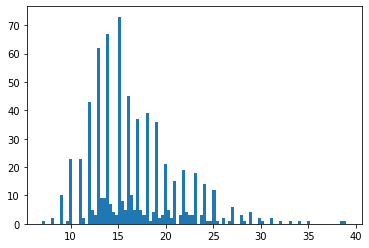

In [ ]:
plt.hist(snrs, bins=100)

# **Set Config Values** 


In [ ]:
%matplotlib inline

from TTS.utils.audio import AudioProcessor
from TTS.tts.utils.visual import plot_spectrogram
from TTS.config import load_config

import IPython.display as ipd
import glob

In [ ]:
from TTS.config.shared_configs import BaseAudioConfig
CONFIG = BaseAudioConfig()

Set Datapath and confirm that it reads all files in your dataset

In [ ]:
config_path = "/content/drive/MyDrive/VoiceCloning/configs/generic_config.json" #DO NOT CHANGE
data_path = "/content/drive/MyDrive/VoiceCloning/fetusboy" #CHANGE TO DATASET FOLDER

file_paths = glob.glob(data_path + "/**/*.wav", recursive=True)
CONFIG = load_config(config_path)

# Change this to the index of the desired file listed below
sample_file_index = 64

SAMPLE_FILE_PATH = file_paths[sample_file_index]

print("File list, by index:")
dict(enumerate(file_paths))

Setup Audio Processor
Play with the AP parameters until you find a good fit with the synthesis speech below.

The default values are loaded from your config.json file, so you only need to uncomment and modify values below that you'd like to tune.

In [ ]:
tune_params={
#  'audio_processor': 'audio',
#  'num_mels': 80,          # In general, you don't need to change this. 
#  'fft_size': 1024,        # In general, you don't need to change this.
#  'sample_rate': 22050,    # This must match the sample rate of the dataset.
#  'hop_length': 256,       # In general, you don't need to change this.
#  'win_length': 1024,      # In general, you don't need to change this.
#  'preemphasis': 0.98,     # In general, 0 gives better voice recovery but makes training harder. If your model does not train, try 0.97 - 0.99.
#  'min_level_db': -100,
#  'ref_level_db': 0,       # The base DB; increase until all background noise is removed in the spectrogram, then lower until you hear better speech below.
#  'power': 1.5,            # Change this value and listen to the synthesized voice. 1.2 - 1.5 are resonable values.
#  'griffin_lim_iters': 60, # Quality does not improve for values > 60
#  'mel_fmin': 0.0,         # Adjust this and check mel-spectrogram-based voice synthesis below.
#  'mel_fmax': 8000.0,      # Adjust this and check mel-spectrogram-based voice synthesis below.
#  'do_trim_silence': True  # If you dataset has some silience at the beginning or end, this trims it. Check the AP.load_wav() below,if it causes any difference for the loaded audio file.
}

# These options have to be forced off in order to avoid errors about the 
# pre-calculated not matching the options being tuned.
reset={
 'signal_norm': True,  # check this if you want to test normalization parameters.
 'stats_path': None,
 'symmetric_norm': False,
 'max_norm': 1,
 'clip_norm': True,
}

# Override select parts of loaded config with parameters above
tuned_config = CONFIG.audio.copy()
tuned_config.update(reset)
tuned_config.update(tune_params)

AP = AudioProcessor(**tuned_config);

 > Setting up Audio Processor...
 | > sample_rate:22050
 | > resample:False
 | > num_mels:80
 | > log_func:np.log10
 | > min_level_db:-100
 | > frame_shift_ms:None
 | > frame_length_ms:None
 | > ref_level_db:20
 | > fft_size:1024
 | > power:1.5
 | > preemphasis:0.0
 | > griffin_lim_iters:60
 | > signal_norm:True
 | > symmetric_norm:False
 | > mel_fmin:0
 | > mel_fmax:None
 | > pitch_fmin:0.0
 | > pitch_fmax:640.0
 | > spec_gain:20.0
 | > stft_pad_mode:reflect
 | > max_norm:1.0
 | > clip_norm:True
 | > do_trim_silence:True
 | > trim_db:45
 | > do_sound_norm:False
 | > do_amp_to_db_linear:True
 | > do_amp_to_db_mel:True
 | > do_rms_norm:False
 | > db_level:None
 | > stats_path:None
 | > base:10
 | > hop_length:256
 | > win_length:1024


Listen to a raw recording of a voice sample to gage future configuration values

### AP Power

In [ ]:
wav = AP.load_wav(SAMPLE_FILE_PATH)
ipd.Audio(data=wav, rate=AP.sample_rate) 

In [ ]:
AP.power = 1.3 # 1-1.6 is a good range to test on

Max: 0.8309473
Min: 0.0
Mean: 0.3669064


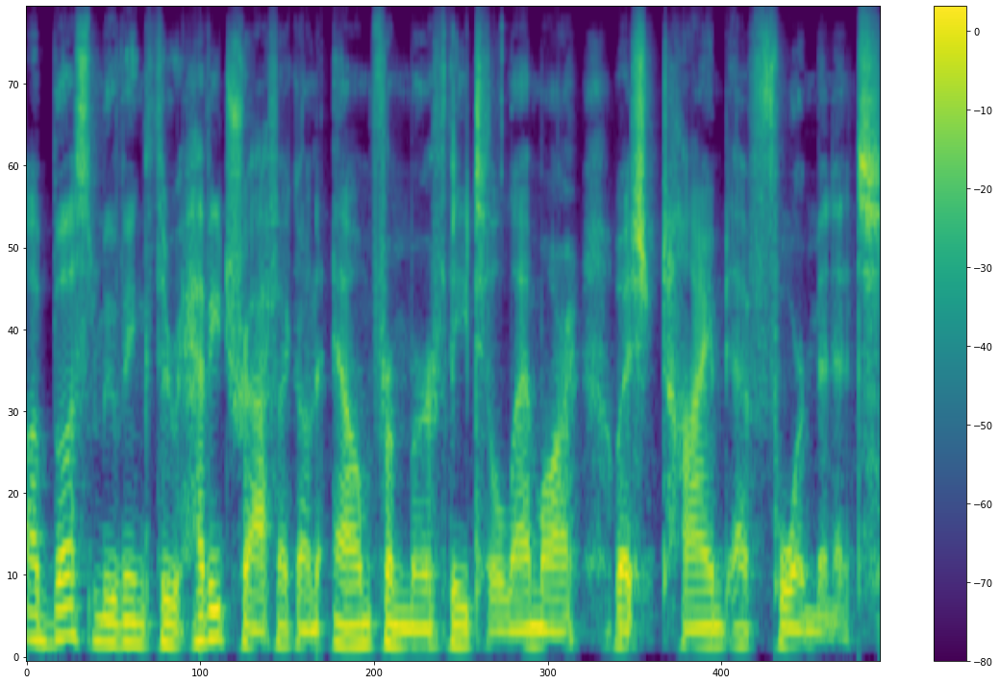

In [ ]:
mel = AP.melspectrogram(wav)
print("Max:", mel.max())
print("Min:", mel.min())
print("Mean:", mel.mean())
plot_spectrogram(mel.T, AP, output_fig=True)

wav_gen = AP.inv_melspectrogram(mel)
ipd.Audio(wav_gen, rate=AP.sample_rate)

Max: 1.0
Min: 0.0
Mean: 0.5237085


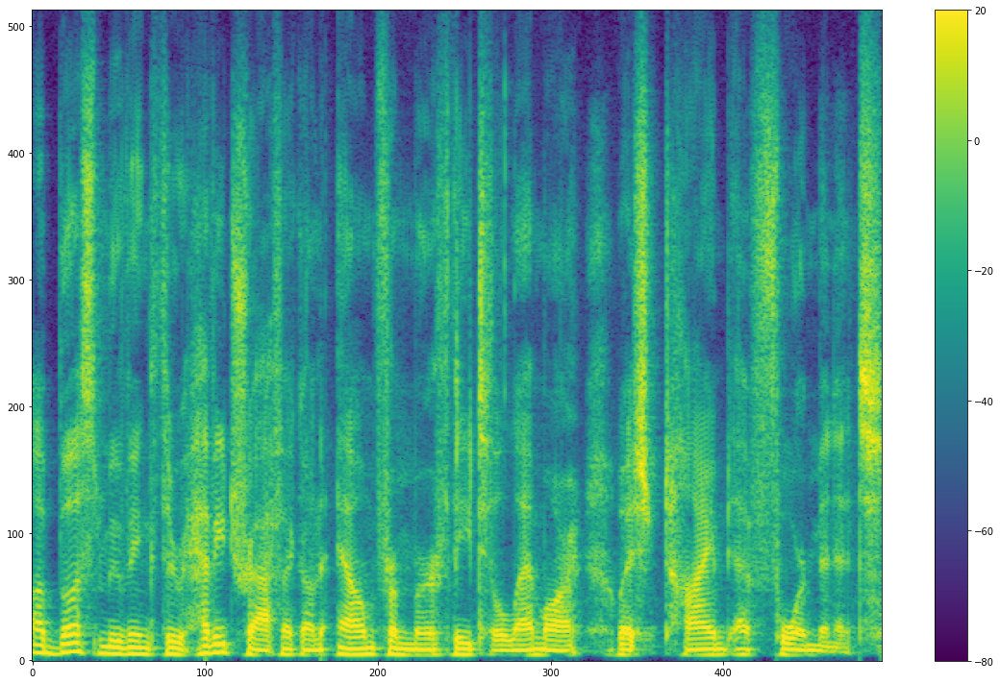

In [ ]:
spec = AP.spectrogram(wav)
print("Max:", spec.max())
print("Min:", spec.min())
print("Mean:", spec.mean())
plot_spectrogram(spec.T, AP, output_fig=True)

wav_gen = AP.inv_spectrogram(spec)
ipd.Audio(wav_gen, rate=AP.sample_rate)

## Compare Values

In [ ]:
from librosa import display
from matplotlib import pylab as plt
import IPython
plt.rcParams['figure.figsize'] = (20.0, 16.0)

def compare_values(attribute, values):
    """
    attributes (str): the names of the attribute you like to test.
    values (list): list of values to compare.
    """
    file = SAMPLE_FILE_PATH
    wavs = []
    for idx, val in enumerate(values):
        set_val_cmd = "AP.{}={}".format(attribute, val)
        exec(set_val_cmd)
        wav = AP.load_wav(file)
        spec = AP.spectrogram(wav)
        spec_norm = AP.denormalize(spec.T)
        plt.subplot(len(values), 2, 2*idx + 1)
        plt.imshow(spec_norm.T, aspect="auto", origin="lower")
        #         plt.colorbar()
        plt.tight_layout()
        wav_gen = AP.inv_spectrogram(spec)
        wavs.append(wav_gen)
        plt.subplot(len(values), 2, 2*idx + 2)
        display.waveplot(wav, alpha=0.5)
        display.waveplot(wav_gen, alpha=0.25)
        plt.title("{}={}".format(attribute, val))
        plt.tight_layout()
    
    wav = AP.load_wav(file)
    print(" > Ground-truth")
    IPython.display.display(IPython.display.Audio(wav, rate=AP.sample_rate))
    
    for idx, wav_gen in enumerate(wavs):
        val = values[idx]
        print(" > {} = {}".format(attribute, val))
        IPython.display.display(IPython.display.Audio(wav_gen, rate=AP.sample_rate))

### Preemphasis

 > Ground-truth


 > preemphasis = 0


 > preemphasis = 0.5


 > preemphasis = 0.99


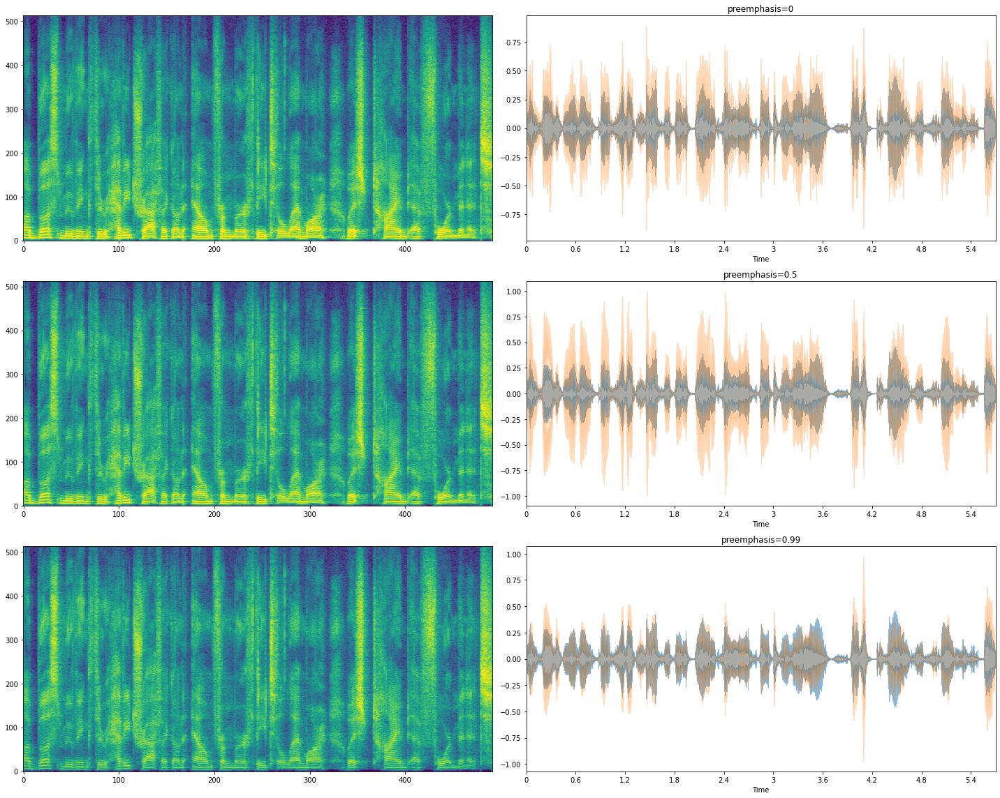

In [ ]:
compare_values("preemphasis", [0, 0.5, 0.99])

### Ref Level DB

 > Ground-truth


 > ref_level_db = 2


 > ref_level_db = 5


 > ref_level_db = 10


 > ref_level_db = 15


 > ref_level_db = 20


 > ref_level_db = 25


 > ref_level_db = 30


 > ref_level_db = 35


 > ref_level_db = 40


 > ref_level_db = 60


 > ref_level_db = 80


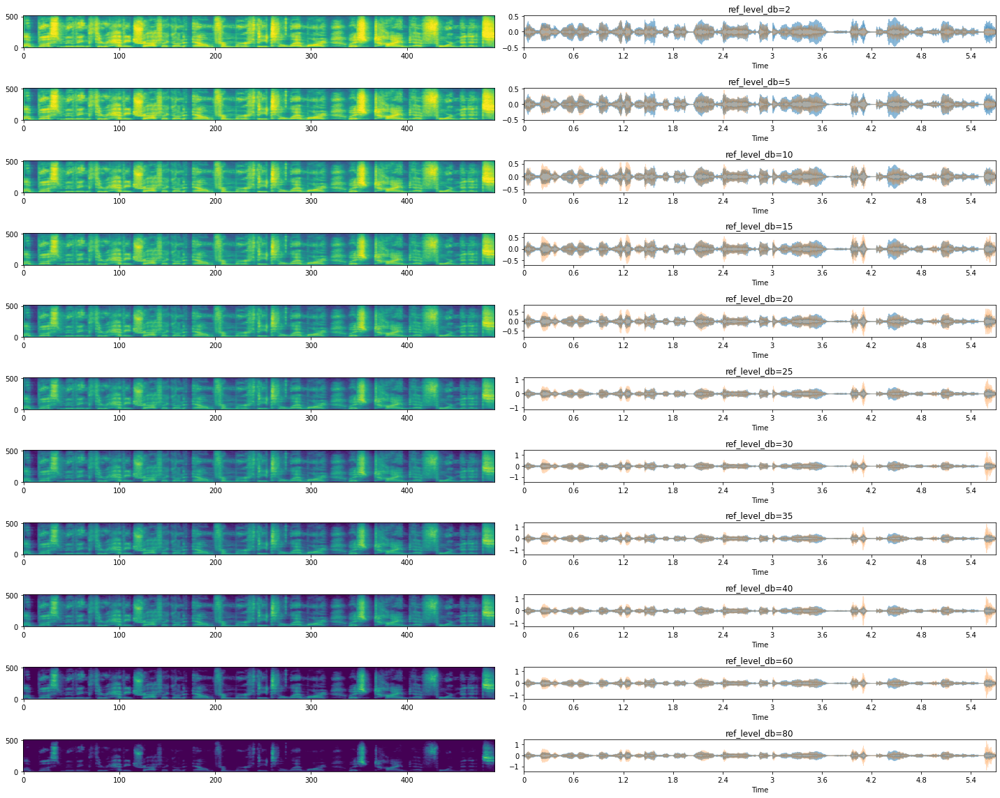

In [ ]:
compare_values("ref_level_db", [2, 5, 10, 15, 20, 25, 30, 35, 40, 60, 80])